# Importing libraries

In [3]:
import torch
from torchvision import transforms
import torchvision.datasets as datasets
from torch import nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from torchvision.utils import make_grid
from torch.utils.data.dataloader import DataLoader
from torch.utils.data import random_split

##Downloading the data

# PASCAL VOC 2007 Dataset

PASCAL VOC 2007 dataset consist of three parts- training (2501 images), validation (2510 images) and test (4952 images). Dataset consist of 20 classes. Each sample has one or more labels associated.  

Link = https://drive.google.com/file/d/11_-KG6fzr0OyvHYcKubllBW8PQl_dMIT/view?usp=drive_link

In [4]:
!gdown --id 11_-KG6fzr0OyvHYcKubllBW8PQl_dMIT

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=11_-KG6fzr0OyvHYcKubllBW8PQl_dMIT
From (redirected): https://drive.google.com/uc?id=11_-KG6fzr0OyvHYcKubllBW8PQl_dMIT&confirm=t&uuid=535658b4-08cd-4932-90e8-7189a75f04ab
To: /content/VOC2007.tar
100% 906M/906M [00:10<00:00, 84.2MB/s]


In [5]:
!tar -xf /content/VOC2007.tar -C /content/

In [7]:
# ---- Minimal VOC2007 multi-label loader (images + XML -> (img, multi-hot)) ----
import os, glob, random, xml.etree.ElementTree as ET
from typing import List, Dict
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms

# 20 Pascal VOC classes
VOC_CLASSES = [
    "aeroplane","bicycle","bird","boat","bottle",
    "bus","car","cat","chair","cow",
    "diningtable","dog","horse","motorbike","person",
    "pottedplant","sheep","sofa","train","tvmonitor",
]
CLS2IDX = {c:i for i,c in enumerate(VOC_CLASSES)}
NUM_CLASSES = len(VOC_CLASSES)

# Point this to the VOC2007 root that has JPEGImages/ and Annotations/
# Example structures:
#   VOC_ROOT/JPEGImages/*.jpg
#   VOC_ROOT/Annotations/*.xml
# (Optionally) VOC_ROOT/ImageSets/Main/{train,val,test,trainval}.txt
VOC_ROOT = "/content/VOC2007"

# Standard ResNet transforms
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

def parse_voc_xml(xml_path: str) -> List[str]:
    """Return list of object class names from a VOC XML file."""
    root = ET.parse(xml_path).getroot()
    objs = root.findall("object")
    names = []
    for obj in objs:
        name = obj.find("name").text.strip()
        names.append(name)
    return names

def build_multi_hot(names: List[str]) -> torch.Tensor:
    """Map list of class names -> 20-dim multi-hot vector."""
    y = torch.zeros(NUM_CLASSES, dtype=torch.float32)
    for n in names:
        if n in CLS2IDX:
            y[CLS2IDX[n]] = 1.0
    return y

def read_imageset_ids(voc_root: str, split: str) -> List[str]:
    """
    If ImageSets/Main/<split>.txt exists, read ids from there.
    Else, derive ids from Annotations/*.xml (and optionally split randomly).
    """
    set_file = os.path.join(voc_root, "ImageSets", "Main", f"{split}.txt")
    if os.path.isfile(set_file):
        with open(set_file, "r") as f:
            ids = [line.strip().split()[0] for line in f if line.strip()]
        return ids

    # Fallback: derive from XMLs then split (80/20) deterministically
    xmls = sorted(glob.glob(os.path.join(voc_root, "Annotations", "*.xml")))
    ids = [os.path.splitext(os.path.basename(x))[0] for x in xmls]
    random.seed(1234)
    random.shuffle(ids)
    if split == "train":
        return ids[: int(0.8 * len(ids))]
    elif split in ("val", "test"):
        return ids[int(0.8 * len(ids)) :]
    else:  # trainval
        return ids

class VOC2007MultiLabel(Dataset):
    def __init__(self, voc_root: str, split: str = "train",
                 transform=None):
        self.voc_root = voc_root
        self.img_dir = os.path.join(voc_root, "JPEGImages")
        self.ann_dir = os.path.join(voc_root, "Annotations")
        self.ids = read_imageset_ids(voc_root, split)
        self.transform = transform

        # Filter to samples that have both image and xml present
        kept = []
        for i in self.ids:
            img_path = os.path.join(self.img_dir, f"{i}.jpg")
            xml_path = os.path.join(self.ann_dir, f"{i}.xml")
            if os.path.isfile(img_path) and os.path.isfile(xml_path):
                kept.append(i)
        self.ids = kept

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img_path = os.path.join(self.img_dir, f"{img_id}.jpg")
        xml_path = os.path.join(self.ann_dir, f"{img_id}.xml")

        # image
        img = Image.open(img_path).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)

        # labels -> multi-hot
        names = parse_voc_xml(xml_path)
        target = build_multi_hot(names)

        return img, target

# ---- Build datasets
voc_data_train = VOC2007MultiLabel(VOC_ROOT, split="train", transform=transform)
voc_data_val   = VOC2007MultiLabel(VOC_ROOT, split="val",   transform=transform)  # or "test"


NUM_CLASSES = len(VOC_CLASSES)
print("Train sizes:", len(voc_data_train),
      "\nVal size:",len(voc_data_val), "\nNUM_CLASSES:", NUM_CLASSES)


Train sizes: 2501 
Val size: 2510 
NUM_CLASSES: 20


In [8]:
def plot_images(voc_data, number_of_images):
    """
    Visualize random images + their labels from VOC2007 multi-label dataset.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import torch

    indices = torch.randint(0, len(voc_data), (number_of_images,))
    for i in indices:
        image_tensor, target = voc_data[i]   # (C,H,W), multi-hot vector

        # Convert tensor to numpy image (de-normalize)
        img = image_tensor.permute(1, 2, 0).numpy()
        img = np.clip(img * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406]), 0, 1)

        # Decode multi-hot into class names
        active = target.nonzero(as_tuple=True)[0].tolist()
        labels = [VOC_CLASSES[j] for j in active]

        print("Labels:", labels)
        plt.imshow(img)
        plt.axis("off")
        plt.show()
        print("=" * 80)


In [9]:
voc_data_train[100], voc_data_train[100][0].shape, len(voc_data_train)

((tensor([[[ 0.1254,  0.1254,  0.1254,  ...,  0.3652,  0.3481,  0.3481],
           [ 0.1597,  0.1597,  0.1426,  ...,  0.3823,  0.3652,  0.3481],
           [ 0.1597,  0.1768,  0.1597,  ...,  0.3652,  0.3481,  0.3481],
           ...,
           [-1.5528, -1.5528, -1.5528,  ..., -0.6452, -0.6452, -0.6623],
           [-1.5870, -1.6042, -1.5699,  ..., -0.6623, -0.6452, -0.6623],
           [-1.6042, -1.5870, -1.5699,  ..., -0.6452, -0.6452, -0.6794]],
  
          [[ 0.5203,  0.5203,  0.5203,  ...,  0.7654,  0.7654,  0.7829],
           [ 0.5203,  0.5203,  0.5378,  ...,  0.7829,  0.7829,  0.7829],
           [ 0.5028,  0.5203,  0.5203,  ...,  0.7654,  0.7829,  0.7829],
           ...,
           [-1.4230, -1.4055, -1.4055,  ..., -0.4951, -0.5301, -0.5651],
           [-1.4055, -1.4055, -1.4055,  ..., -0.5476, -0.5476, -0.5651],
           [-1.3880, -1.3880, -1.4055,  ..., -0.5301, -0.5651, -0.6001]],
  
          [[ 1.1411,  1.1411,  1.1411,  ...,  1.4897,  1.4722,  1.4897],
           

Labels: ['aeroplane']


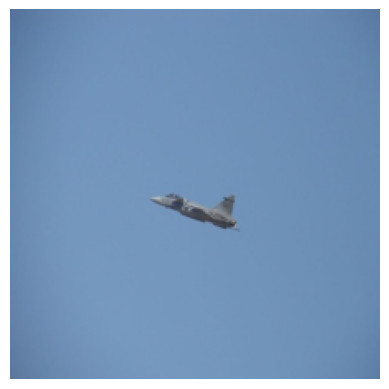

Labels: ['chair', 'person', 'pottedplant', 'sofa']


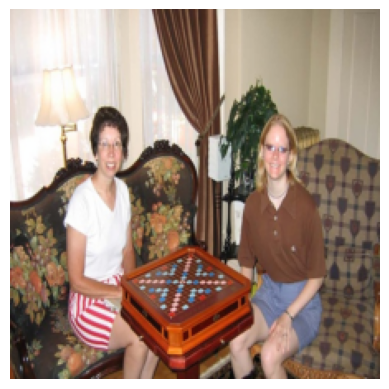

Labels: ['bicycle', 'person']


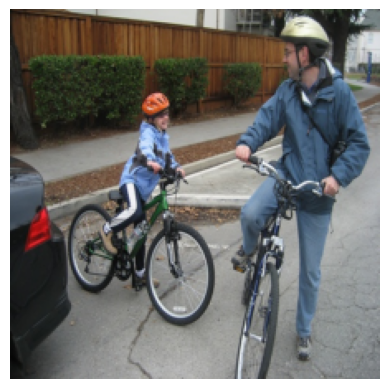

Labels: ['horse', 'person']


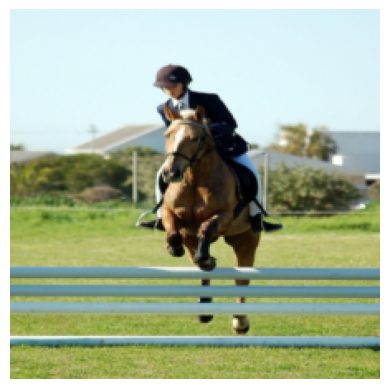

Labels: ['chair', 'diningtable', 'person']


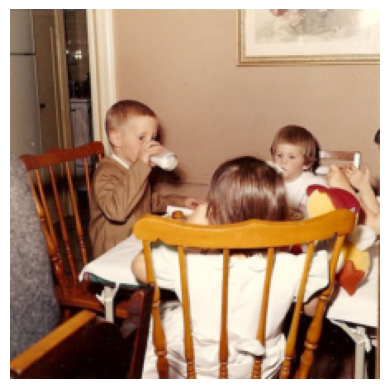

In [10]:
plot_images(voc_data_train, number_of_images = 5)

In [11]:
## store images in a list:

train_img = []
for i in range(len(voc_data_train)):
    train_img.append(voc_data_train[i][0])

train_img[0] #print size

tensor([[[-0.9534, -0.9877, -0.9877,  ..., -1.1247, -1.1589, -1.2103],
         [-0.9534, -0.9877, -0.9877,  ..., -1.0562, -1.1075, -1.1418],
         [-0.9534, -0.9534, -0.9534,  ..., -1.0390, -1.0219, -1.0390],
         ...,
         [-0.8164, -0.7993, -0.7650,  ..., -0.6794, -0.7308, -0.7479],
         [-0.7650, -0.7650, -0.7308,  ..., -0.7137, -0.7137, -0.7137],
         [-0.7137, -0.7137, -0.7137,  ..., -0.7479, -0.7479, -0.7650]],

        [[-0.8452, -0.8803, -0.8803,  ..., -1.0203, -1.0378, -1.0728],
         [-0.8452, -0.8803, -0.8803,  ..., -0.9678, -0.9853, -1.0028],
         [-0.8452, -0.8452, -0.8452,  ..., -0.9503, -0.9153, -0.9153],
         ...,
         [-0.7227, -0.7227, -0.6877,  ..., -0.6176, -0.6176, -0.6352],
         [-0.6702, -0.6702, -0.6527,  ..., -0.6176, -0.6001, -0.6001],
         [-0.6176, -0.6176, -0.6352,  ..., -0.6527, -0.6352, -0.6527]],

        [[-0.6541, -0.6890, -0.6541,  ..., -0.7936, -0.8110, -0.8633],
         [-0.6541, -0.6715, -0.6541,  ..., -0

### Extracting labels from the data

In [12]:
# Extract labels from the dataset
images = {}   # key: sample index, value: list of class names
uniq = []     # unique class names across dataset

for idx in range(len(voc_data_train)):   # use your Dataset object here
    _, target = voc_data_train[idx]      # target is a multi-hot vector [20]
    active = target.nonzero(as_tuple=True)[0].tolist()
    labels = [VOC_CLASSES[j] for j in active]

    images[idx] = labels

    for name in labels:
        if name not in uniq:
            uniq.append(name)

print("Number of unique classes found:", len(uniq))
print("Classes:", uniq)


Number of unique classes found: 20
Classes: ['car', 'horse', 'person', 'bicycle', 'aeroplane', 'train', 'diningtable', 'dog', 'cat', 'chair', 'bird', 'boat', 'pottedplant', 'tvmonitor', 'sofa', 'motorbike', 'bottle', 'bus', 'sheep', 'cow']


In [13]:
images[0], images[1], images[2], images[3], images[4], images[5]


(['car'],
 ['horse', 'person'],
 ['bicycle', 'person'],
 ['car'],
 ['aeroplane', 'person'],
 ['aeroplane'])

In [14]:
uniq

['car',
 'horse',
 'person',
 'bicycle',
 'aeroplane',
 'train',
 'diningtable',
 'dog',
 'cat',
 'chair',
 'bird',
 'boat',
 'pottedplant',
 'tvmonitor',
 'sofa',
 'motorbike',
 'bottle',
 'bus',
 'sheep',
 'cow']

### Checking class distribution in the dataset

In [15]:
counter_dict = {}

for labels in images.values():

    for item in labels:

        if item not in counter_dict:
            counter_dict[item] = 1
        else:
            counter_dict[item]+=1

counter_dict

{'car': 402,
 'horse': 144,
 'person': 1070,
 'bicycle': 122,
 'aeroplane': 113,
 'train': 128,
 'diningtable': 130,
 'dog': 210,
 'cat': 166,
 'chair': 282,
 'bird': 182,
 'boat': 87,
 'pottedplant': 153,
 'tvmonitor': 144,
 'sofa': 188,
 'motorbike': 123,
 'bottle': 153,
 'bus': 100,
 'sheep': 49,
 'cow': 71}

*Clearly there is class imbalance. Number of samples for person and car is very high. boat, sheep, cow has very low number of samples. Since each image has multilabels we cannot simply delete the images with labels persons. It will reduce the count for other labels as well. We can eliminate labels which has count not in the range 150-250, not removing other labels associated.*

In [16]:
## classes to eliminate
labels_to_eliminate =[]

for item in uniq:
    if counter_dict[item] <= 150 or counter_dict[item] >= 250:
        labels_to_eliminate.append(item)

labels_to_eliminate

['car',
 'horse',
 'person',
 'bicycle',
 'aeroplane',
 'train',
 'diningtable',
 'chair',
 'boat',
 'tvmonitor',
 'motorbike',
 'bus',
 'sheep',
 'cow']

In [17]:
upd_train_labels = []
upd_train_img = []

for i, labels in images.items():
    rej = False
    for item in labels:
        if item in labels_to_eliminate:
            rej = True
            break
    if not rej:
        upd_train_labels.append(labels)
        upd_train_img.append(train_img[i])

In [18]:
print('length of training dataset:', len(upd_train_img))

length of training dataset: 514


### Vectorising the labels

In [19]:
## classes present in the new train set
upd_labels = [item for item in uniq if item not in labels_to_eliminate]
num_classes = len(upd_labels)
print('number of classes:', num_classes)
print(upd_labels)

number of classes: 6
['dog', 'cat', 'bird', 'pottedplant', 'sofa', 'bottle']


In [20]:
## vectorising
from sklearn.feature_extraction.text import CountVectorizer

# Create a Vectorizer Object
vectorizer = CountVectorizer()

vectorizer.fit(upd_labels)

CountVectorizer()

In [21]:
# Encode each classes
vector = vectorizer.transform(upd_labels)

In [22]:
print("Vocabulary: ", vectorizer.vocabulary_)

Vocabulary:  {'dog': 3, 'cat': 2, 'bird': 0, 'pottedplant': 4, 'sofa': 5, 'bottle': 1}


In [23]:
## creating a dictionary which has class name as keys and class index as values
label_to_id  = vectorizer.vocabulary_
id_to_label = {}   ## class index as keys and class names as values

for item, val in label_to_id.items():
    id_to_label[val] = item

In [24]:
label_to_id

{'dog': 3, 'cat': 2, 'bird': 0, 'pottedplant': 4, 'sofa': 5, 'bottle': 1}

In [25]:
id_to_label

{3: 'dog', 2: 'cat', 0: 'bird', 4: 'pottedplant', 5: 'sofa', 1: 'bottle'}

In [26]:
### store all the classes in the order of their class index
labels_all = [id_to_label[i] for i in range(len(id_to_label))]
labels_all

['bird', 'bottle', 'cat', 'dog', 'pottedplant', 'sofa']

In [27]:
## store class names and its vector representations
labels_to_vec ={}
for i,item in enumerate(vectorizer.vocabulary_.keys()):
    labels_to_vec[item] = vector.toarray()[i]

In [28]:
labels_to_vec

{'dog': array([0, 0, 0, 1, 0, 0]),
 'cat': array([0, 0, 1, 0, 0, 0]),
 'bird': array([1, 0, 0, 0, 0, 0]),
 'pottedplant': array([0, 0, 0, 0, 1, 0]),
 'sofa': array([0, 0, 0, 0, 0, 1]),
 'bottle': array([0, 1, 0, 0, 0, 0])}

In [29]:
## store labels as vectors for each sample

img_labels_vec = []

for i in range(len(upd_train_img)):
    labels = upd_train_labels[i]
    dummy  = [0]*num_classes
    for l in labels:
        dummy += labels_to_vec[l]

    img_labels_vec.append(dummy)

In [30]:
img_labels_vec[0], img_labels_vec[42]

(array([0, 0, 0, 1, 0, 0]), array([0, 0, 1, 1, 0, 1]))

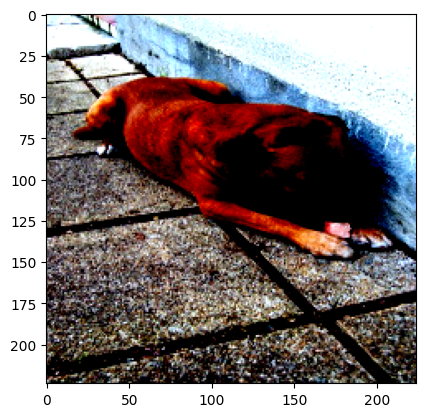

Labels: ['dog']


In [32]:
image = upd_train_img[0].numpy().transpose((1, 2, 0))

plt.imshow(image)
plt.show()
labels = upd_train_labels[0]
print("Labels:", labels)

Images have more than 2 labels

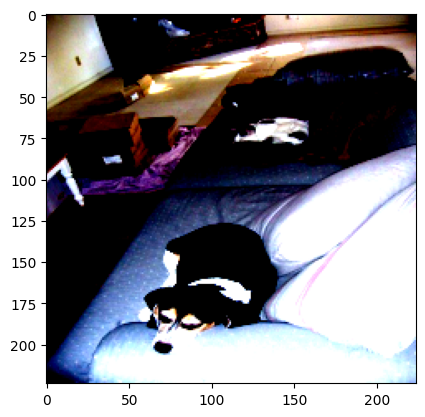

Labels: ['cat', 'dog', 'sofa']


In [33]:
                                           # H, W, C
image = upd_train_img[42].numpy().transpose((1, 2, 0))

plt.imshow(image)
plt.show()# add labels
labels = upd_train_labels[42]
print("Labels:", labels)

In [30]:
# for i in range(len(img_labels_vec)):
#     print(i, img_labels_vec[i])

### Validation set

In [35]:
voc_data_val   = VOC2007MultiLabel(VOC_ROOT, split="val",   transform=transform)

In [36]:
len(voc_data_val)

2510

In [37]:
## store image
val_img=[]
for i in range(len(voc_data_val)):
    val_img.append(voc_data_val[i][0])

In [38]:
upd_val_labels = []
upd_val_img = []

for idx in range(len(voc_data_val)):   # val_data = VOC2007MultiLabel(...)
    img_tensor, target = voc_data_val[idx]
    active = target.nonzero(as_tuple=True)[0].tolist()
    labelss = [VOC_CLASSES[j] for j in active]

    # Skip image if it has any class in labels_to_eliminate
    if any(l in labels_to_eliminate for l in labelss):
        continue

    upd_val_labels.append(labelss)
    upd_val_img.append(img_tensor)


In [39]:
## store labels in vector representation

img_labels_vec_val = []

for i in range(len(upd_val_img)):
    labels = upd_val_labels[i]
    dummy  = [0]*num_classes
    for l in labels:
        # print(l)
        dummy += labels_to_vec[l]
    img_labels_vec_val.append(dummy)

In [40]:
len(upd_val_img), upd_val_labels[465], img_labels_vec_val[465]

(516, ['dog', 'sofa'], array([0, 0, 0, 1, 0, 1]))

In [37]:
# for i in range(len(upd_val_img)):
#     print(i, upd_val_labels[i])

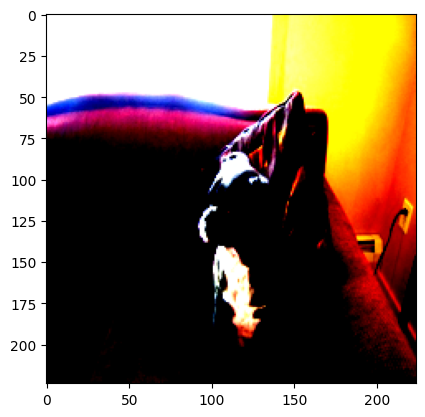

Labels: ['dog', 'sofa']


In [42]:
image = upd_val_img[465].numpy().transpose((1, 2, 0))

plt.imshow(image)
plt.show()
labels = upd_val_labels[465]
print("Labels:", labels)

#### Test data

In [43]:
voc_data_test = VOC2007MultiLabel(VOC_ROOT, split="test",   transform=transform)

In [44]:
len(voc_data_test)

4952

In [45]:
## store image
test_img = []
for i in range(len(voc_data_test)):
    test_img.append(voc_data_test[i][0])
# test_img[0]

In [46]:
# Assumes:
# - test_data = VOC2007MultiLabel(..., split="test" or "val")
# - VOC_CLASSES is the 20-class list
# - labels_to_eliminate is a list/set of class names to drop

upd_test_labels = []
upd_test_img = []

for idx in range(len(voc_data_test)):
    img_tensor, target = voc_data_test[idx]              # target: torch.FloatTensor [20]
    active = target.nonzero(as_tuple=True)[0].tolist()
    labelss = [VOC_CLASSES[j] for j in active]

    # skip if any unwanted label is present
    if any(lbl in labels_to_eliminate for lbl in labelss):
        continue

    upd_test_labels.append(labelss)
    upd_test_img.append(img_tensor)


In [47]:
## store labels in vector representation
img_labels_vec_test = []
for i in range(len(upd_test_img)):
    labels = upd_test_labels[i]
    dummy  = [0]*num_classes
    for l in labels:
        dummy += labels_to_vec[l]
    img_labels_vec_test.append(dummy)

In [48]:
# for i in range(len(upd_test_img)):
#     print(i, upd_test_labels[i])

In [49]:
upd_test_labels[987], img_labels_vec_test[987]

(['bottle', 'cat', 'pottedplant'], array([0, 1, 1, 0, 1, 0]))

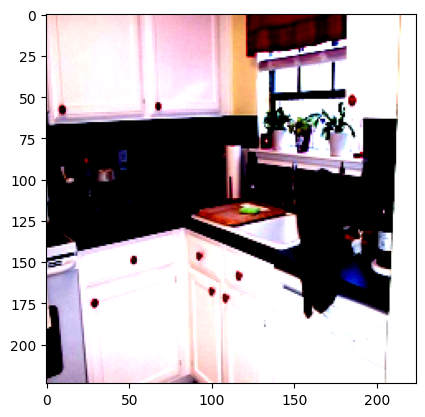

Labels: ['bottle', 'cat', 'pottedplant']


In [51]:
image = upd_test_img[987].numpy().transpose((1, 2, 0))

plt.imshow(image)
plt.show()
labels = upd_test_labels[987]
print("Labels:", labels)

**Shuffling and creating batches of data-**

In [52]:
## train_list store tuple of images and labels
train_list = []
for i in range(len(upd_train_img)):
    train_list.append(tuple([upd_train_img[i],img_labels_vec[i]]))

In [53]:
## val_list store tuple of images and labels
val_list = []
for i in range(len(upd_val_img)):
    val_list.append(tuple([upd_val_img[i],img_labels_vec_val[i]]))

In [54]:
## test_list store tuple of images and labels
test_list = []
for i in range(len(upd_test_img)):
    test_list.append(tuple([upd_test_img[i],img_labels_vec_test[i]]))

In [55]:
## making batches for train, validation and test data
train_dataloader = torch.utils.data.DataLoader(train_list, batch_size = 32, drop_last = True, shuffle = True)
val_dataloader   = torch.utils.data.DataLoader(val_list,   batch_size = 32, drop_last = True, shuffle = False)
test_dataloader  = torch.utils.data.DataLoader(test_list,  batch_size = 32, drop_last = True, shuffle = False)

In [56]:
## printing the size of train, validation and test data
print("Training dataset size: ",   len(upd_train_img))
print("Validation dataset size: ", len(upd_val_img))
print("Testing dataset size: ",    len(upd_test_img))

Training dataset size:  514
Validation dataset size:  516
Testing dataset size:  1020


In [57]:
## printing the batches in train, validation and test data
print("No. of batches in Training dataset : ", len(train_dataloader))
print("No. of batches in Validation dataset : ", len(val_dataloader))
print("No. of batches in Testing dataset : ", len(test_dataloader))

No. of batches in Training dataset :  16
No. of batches in Validation dataset :  16
No. of batches in Testing dataset :  31


In [53]:
##plotting sample image

# for i in range(5):
#     image, target = train_list[i]
#     indices = np.where(np.array(target)==1)[0] ## indices where value = 1
#     target_labels = [] ## store labels
#     for i in indices:
#         target_labels.append(dic_embd_label[i])

#     print('label', target_labels)
#     plt.imshow(image.permute(1,2,0))  # we need permute here because matplotlib wants to have the channels as the last dimension
#     plt.show()

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


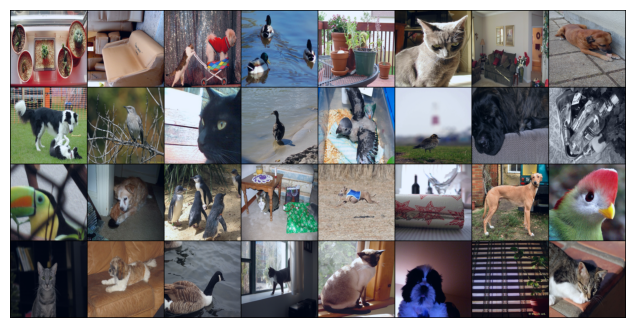

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


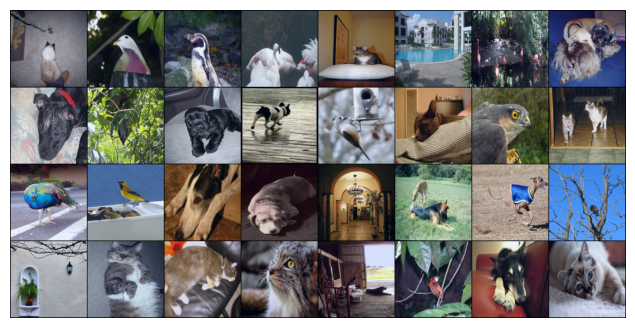

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


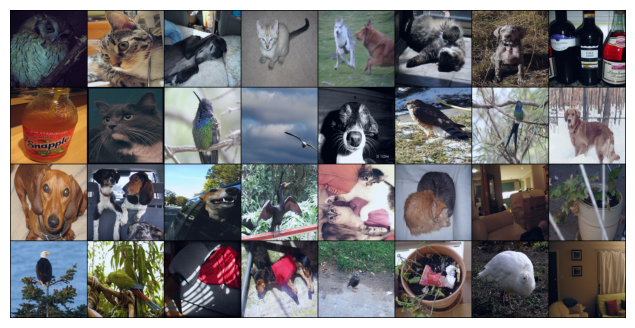

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


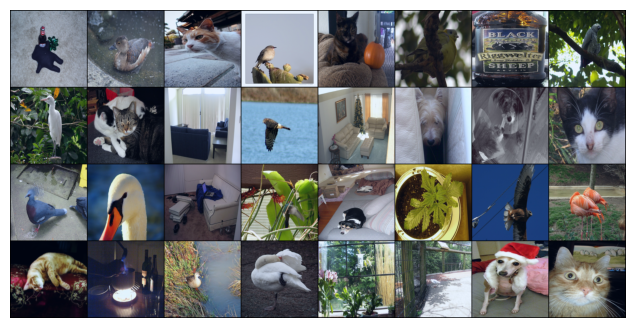

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


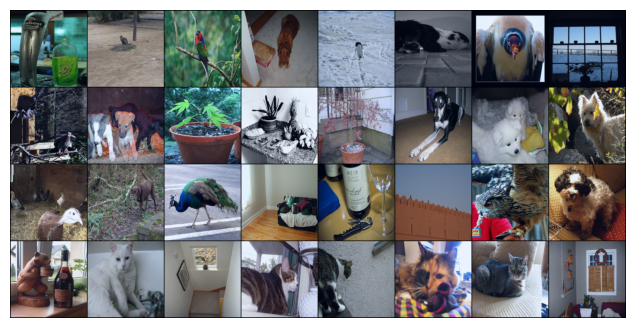

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


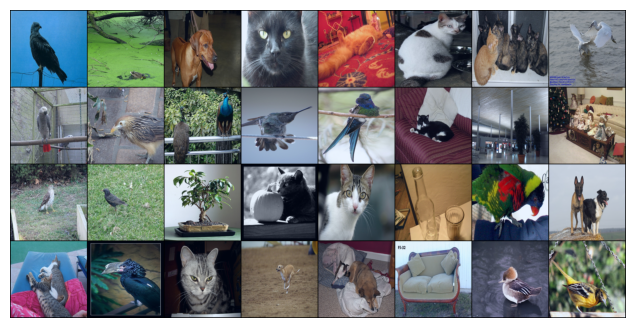

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


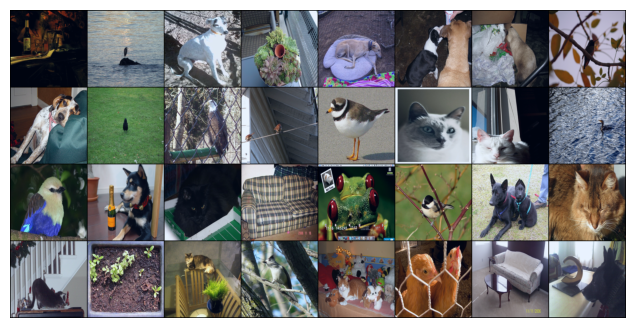

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


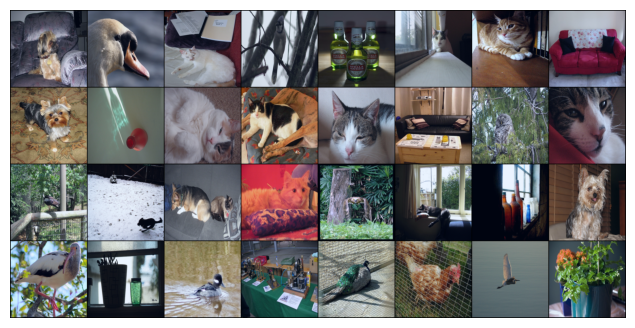

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


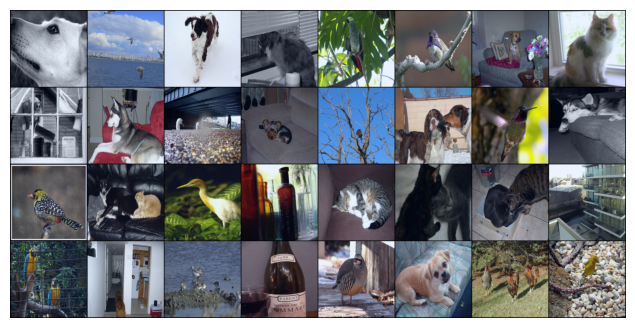

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


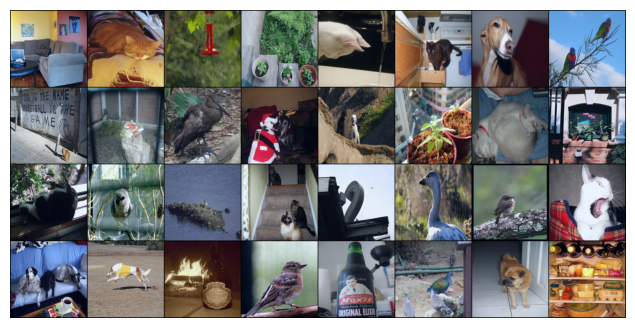

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


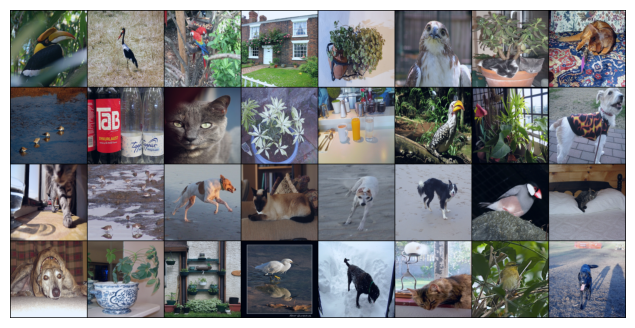

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


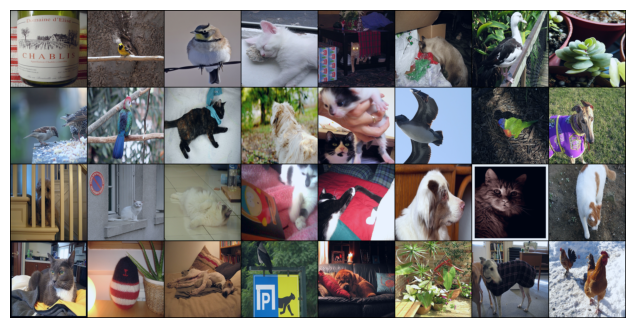

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


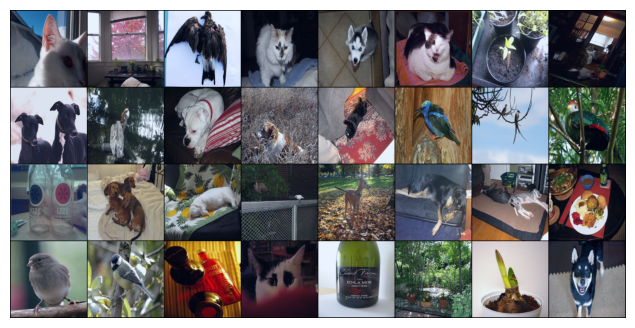

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


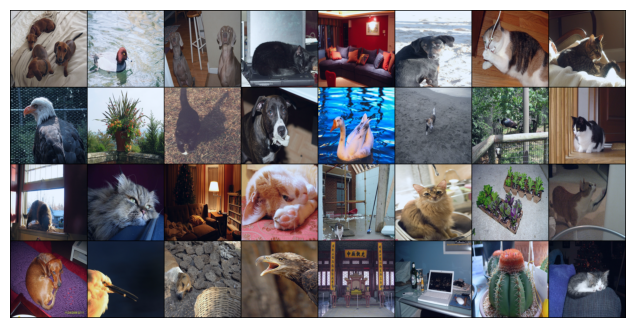

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


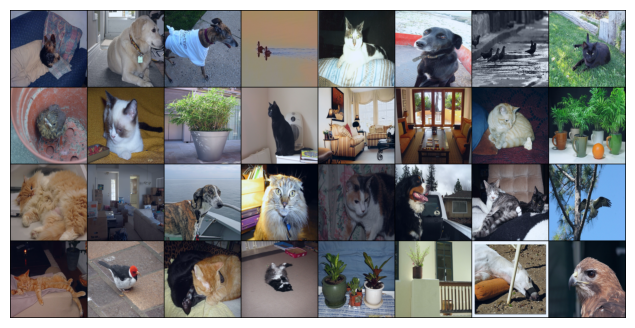

Shape of an Image (Batch Size, RGB, Pixels): torch.Size([32, 3, 224, 224])


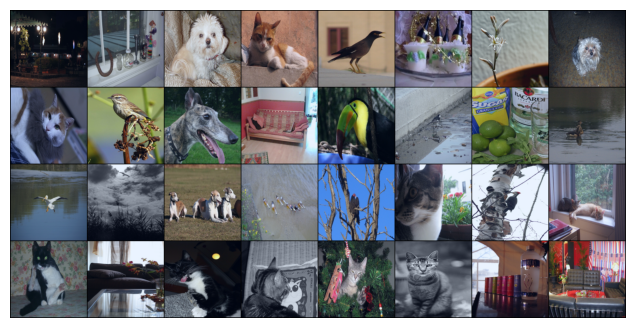

In [59]:
for img, _ in train_dataloader:
    print('Shape of an Image (Batch Size, RGB, Pixels):', img.shape)
    plt.figure(figsize = (8, 4))
    plt.axis('off')
    # Add normalize=True to fix the data range
    plt.imshow(make_grid(img, normalize=True).permute(1, 2, 0)) # we need permute here because matplotlib wants to have the channels as the last dimension
    plt.show();

## ResNet

### Residual block:

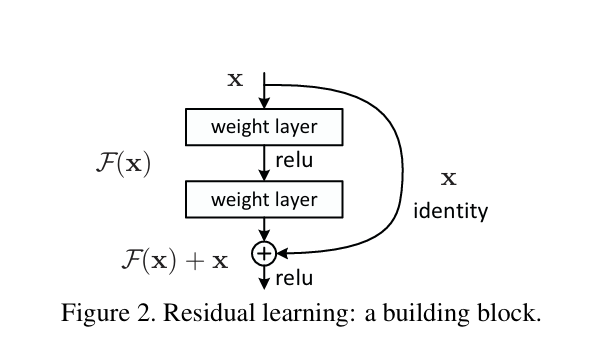

$\textbf{Source:}$ https://arxiv.org/pdf/1512.03385

Formally, in this paper we consider a building block defined as:
$$
\mathbf{y}=\mathcal{F}\left(\mathbf{x},\left\{W_i\right\}\right)+\mathbf{x} \quad ...    \quad (1)
$$

Here $\mathbf{x}$ and $\mathbf{y}$ are the input and output vectors of the layers considered. The function $\mathcal{F}\left(\mathbf{x},\left\{W_i\right\}\right)$ represents the residual mapping to be learned. For the example in Fig. 2. that has two layers, $\mathcal{F}=W_2 \sigma\left(W_1 \mathbf{x}\right)$ in which $\sigma$ denotes ReLU activation.


$$
\mathbf{y}=\mathcal{F}\left(\mathbf{x},\left\{W_i\right\}\right)+W_s \mathbf{x}
$$

The dimensions of $\mathbf{x}$ and $\mathcal{F}$ must be equal in Eqn.(1).

### Resnet 18 architecture

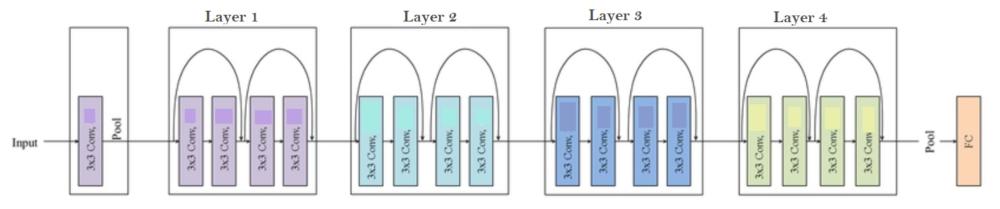

In [60]:
num_classes

6

In [61]:
# 3x3 convolution
def conv3x3(in_channels, out_channels, stride = 1):

    return nn.Conv2d(in_channels, out_channels, kernel_size = 3,
                     stride = stride, padding = 1, bias = False)


# Residual block
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride = 1, downsample = None):
        super(ResidualBlock, self).__init__()

        self.conv1 = conv3x3(in_channels, out_channels, stride)  # convolution layer 1
        self.bn1   = nn.BatchNorm2d(out_channels)                # Create a batch normalization layer (bn1) for the output channels (out_channels)
        self.relu  = nn.ReLU(inplace = True)                     # use activation function = ReLU
        self.conv2 = conv3x3(out_channels, out_channels)         # convolution layer 2
        self.bn2   = nn.BatchNorm2d(out_channels)                # Create a batch normalization layer (bn2) for the output channels (out_channels)
        self.downsample = downsample                             # downsample : it is a layer to match the number of channels  of residual and output of conv1 and conv2

    # forward pass of residual block

    def forward(self, x):

        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample:
            residual = self.downsample(x)   ## update residual by matching the number of channels  of residual and out

        out += residual
        out = self.relu(out)
        return out

# ResNet
class ResNet(nn.Module):
    def __init__(self, block, layers, num_classes = num_classes):
        super(ResNet, self).__init__()

        self.in_channels = 16                                                 # subsequent layers will start with 16 input channels.

        self.conv = conv3x3(in_channels = 3, out_channels = 16)               # first convolution layer in the ResNet
        self.bn   = nn.BatchNorm2d(16)
        self.relu = nn.ReLU(inplace = True)                                   # operation modifies the input tensor directly without allocating additional memory for the output.

        self.layer1 = self.make_layer(block, 16, layers[0], stride = 1)       # this layer consists of layers[0] numbers of residual blocks
        self.layer2 = self.make_layer(block, 32, layers[1], stride = 2)       # this layer consists of layers[1] numbers of residual blocks
        self.layer3 = self.make_layer(block, 64, layers[2], stride = 2)       # this layer consists of layers[2] numbers of residual blocks
        self.layer4 = self.make_layer(block, 128, layers[3],stride = 2)       # this layer consists of layers[3] numbers of residual blocks

        # Create an average pooling layer (avg_pool) with a kernel size of 8x8
        self.avg_pool = nn.AvgPool2d(8)

        self.fc = nn.Linear(1152, num_classes)

    # make layer function: create layers which consists of given number of residual blocks
    def make_layer(self, block, out_channels, blocks, stride = 1):

        '''
        block: residual block
        blocks: number of residual blocks required in this layer
        '''

        downsample = None

        # define downsample if stride != 1
        if (stride != 1) or (self.in_channels != out_channels):

            # downsample consists of one convolution layer
            downsample = nn.Sequential(
                                        conv3x3(self.in_channels, out_channels, stride = stride),
                                        nn.BatchNorm2d(out_channels)
                                        )
        layers = []

        layers.append(block(self.in_channels, out_channels, stride, downsample))  ## appending residual blocks

        self.in_channels = out_channels                                           # Store the output channels of previous layer to the input channels of next layer

        for i in range(1, blocks):
            layers.append(block(out_channels, out_channels))                      ## appending residual blocks

        ## now the list layers has "blocks" number of residual blocks
        return nn.Sequential(*layers)

    ## forward pass
    def forward(self, x):

        # Pass the input through the convolutional layer (conv)
        out = self.conv(x)

        # Apply batch normalization (bn)
        out = self.bn(out)

        # Apply the rectified linear unit (ReLU) activation function
        out = self.relu(out)

        # Pass through the first residual layer (layer1)
        out = self.layer1(out)

        # Pass through the second residual layer (layer2)
        out = self.layer2(out)

        # Pass through the third residual layer (layer3)
        out = self.layer3(out)

        # Pass through the fourth residual layer (layer4)
        out = self.layer4(out)

        # Apply average pooling (avg_pool)
        out = self.avg_pool(out)

        # Reshape the output to a 1D tensor
        out = out.view(out.size(0), -1)

        # Pass through the fully connected layer (fc)
        out = self.fc(out)

        # Return the final output
        return out



In [62]:
#Initialising the model
model = ResNet(ResidualBlock, [2, 2, 2,2])  ## layers = [2,2,2,2] --> each residual layer consists of 2 residual blocks
print("The overall model is - \n")
print(model)
dash = "________________________________________________________________________\n\n"
print(dash)


criterion = torch.nn.BCEWithLogitsLoss()  ## loss function
optimizer = torch.optim.SGD(model.parameters(), lr=0.01,momentum=0.9, weight_decay=0.001)  ## optimizer

The overall model is - 

ResNet(
  (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (layer1): Sequential(
    (0): ResidualBlock(
      (conv1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ResidualBlock(
      (conv1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 

In [58]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = model.to(device)

In [59]:
from torchsummary import summary

# Assuming 'model' is your PyTorch model
summary(model, input_size=(3, 224, 224), batch_size = 32)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [32, 16, 224, 224]             432
       BatchNorm2d-2         [32, 16, 224, 224]              32
              ReLU-3         [32, 16, 224, 224]               0
            Conv2d-4         [32, 16, 224, 224]           2,304
       BatchNorm2d-5         [32, 16, 224, 224]              32
              ReLU-6         [32, 16, 224, 224]               0
            Conv2d-7         [32, 16, 224, 224]           2,304
       BatchNorm2d-8         [32, 16, 224, 224]              32
              ReLU-9         [32, 16, 224, 224]               0
    ResidualBlock-10         [32, 16, 224, 224]               0
           Conv2d-11         [32, 16, 224, 224]           2,304
      BatchNorm2d-12         [32, 16, 224, 224]              32
             ReLU-13         [32, 16, 224, 224]               0
           Conv2d-14         [32, 16, 2

In [60]:
num_epochs = 30
train_loss = list()
val_loss = list()
train_accuracy = list()
val_accuracy = list()
best_val_loss = 1
total_train = 0
correct_train = 0
total_val = 0
correct_val = 0
patience_counter = 0
patience = 5
for epoch in range(num_epochs):
    total_train_loss = 0
    total_val_loss = 0
    total_train = 0
    correct_train = 0
    model.train()
    total_p = 0
    # training
    for itr, (image, label) in enumerate(train_dataloader):

        if (torch.cuda.is_available()):
            image = image.cuda()
            label = label.cuda()



        optimizer.zero_grad()

        pred = model(image)

        # Use binary cross-entropy loss for multilabel classification
        criterion = torch.nn.BCEWithLogitsLoss()
        loss = criterion(pred, label.float())
        total_train_loss += loss.item()

        # Calculate accuracy for multilabel classification
        predicted = (torch.sigmoid(pred) > 0.5).float()   ## use sigmoid function to convert logits into probability, threshold =0.5
        correct_train += (predicted == label).sum().item()
        total_train += label.size(0)

        loss.backward()  ## backward pass
        optimizer.step()  ## parameter update

    accuracy_train = (100 * correct_train) / (total_train * label.size(1))  # Calculate accuracy per label
    train_accuracy.append(accuracy_train)
    total_train_loss = total_train_loss / (itr + 1)
    train_loss.append(total_train_loss)

    # validation
    model.eval()
    total_val = 0
    correct_val = 0
    for itr, (image, label) in enumerate(val_dataloader):

        if (torch.cuda.is_available()):
            image = image.cuda()
            label = label.cuda()

        pred = model(image)   ## prediction

        loss = criterion(pred, label.float())
        total_val_loss += loss.item()

        predicted = (torch.sigmoid(pred) > 0.5).float()   ## use sigmoid function to convert logits into probability, threshold =0.5
        correct_val += (predicted == label).sum().item()
        total_val += label.size(0)


    accuracy = (100 * correct_val) / (total_val * label.size(1))  # Calculate accuracy per label
    val_accuracy.append(accuracy)
    total_val_loss = total_val_loss / (itr + 1)
    val_loss.append(total_val_loss)



    print('\nEpoch: {}/{}, Train Loss: {:.8f},Train Accuracy: {:.8f}, Val Loss: {:.8f}, Val Accuracy: {:.8f}'.format(epoch + 1, num_epochs, total_train_loss,accuracy_train, total_val_loss, accuracy))


    if total_val_loss < best_val_loss:
        best_val_loss = total_val_loss
        print("Saving the model state dictionary for Epoch: {} with Validation loss: {:.8f}".format(epoch + 1, total_val_loss))
        torch.save(model.state_dict(), "model.dth")  ## saving best model
        patience_counter=0  ## reset patience_counter to zero
    else:
        patience_counter+=1  ## increment patience_counter by 1

    ## early stopping condition
    if patience_counter==patience:
        print('Early Stopping')
        break


Epoch: 1/30, Train Loss: 0.50931921,Train Accuracy: 79.23177083, Val Loss: 0.50454628, Val Accuracy: 74.41406250
Saving the model state dictionary for Epoch: 1 with Validation loss: 0.50454628

Epoch: 2/30, Train Loss: 0.42752370,Train Accuracy: 82.84505208, Val Loss: 0.46226044, Val Accuracy: 80.89192708
Saving the model state dictionary for Epoch: 2 with Validation loss: 0.46226044

Epoch: 3/30, Train Loss: 0.41090573,Train Accuracy: 82.58463542, Val Loss: 0.42152740, Val Accuracy: 81.96614583
Saving the model state dictionary for Epoch: 3 with Validation loss: 0.42152740

Epoch: 4/30, Train Loss: 0.39226456,Train Accuracy: 83.04036458, Val Loss: 0.46035092, Val Accuracy: 79.81770833

Epoch: 5/30, Train Loss: 0.38106400,Train Accuracy: 83.52864583, Val Loss: 0.56135440, Val Accuracy: 76.88802083

Epoch: 6/30, Train Loss: 0.37618102,Train Accuracy: 83.95182292, Val Loss: 0.47700189, Val Accuracy: 80.72916667

Epoch: 7/30, Train Loss: 0.37418489,Train Accuracy: 83.46354167, Val Loss: 

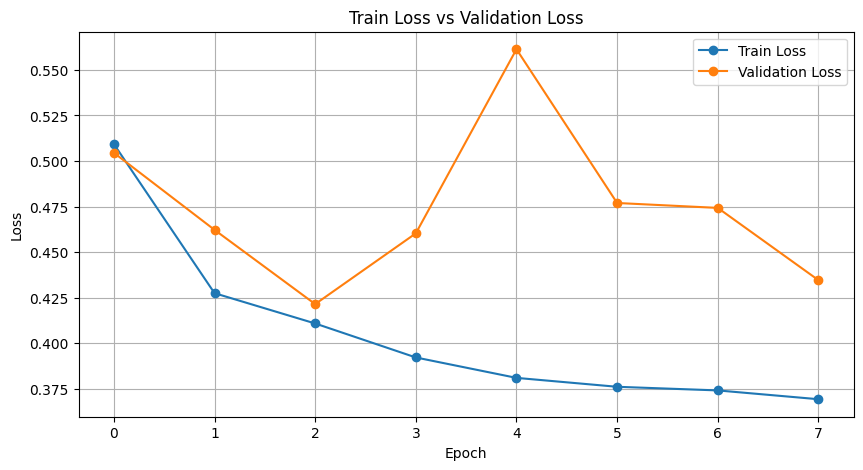

In [61]:
# Plot train loss and validation loss
plt.figure(figsize=(10,5))
plt.plot(train_loss, label='Train Loss', marker='o')
plt.plot(val_loss, label='Validation Loss', marker='o')

# Add labels and a legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.grid()
plt.title('Train Loss vs Validation Loss')
plt.show()

In [62]:
## create dataframe of the results
def TabularFormat(epochs,train_cost,train_acc,eval_cost,eval_acc):
  ep = []
  for i in range(1,epochs+1):
    ep.append(i)
  return pd.DataFrame(list(zip(ep,train_cost,train_acc,eval_cost,eval_acc)),columns = ['Epoch Value','Training Loss','Training Accuracy','Validation loss','Validation Accuracy'])

In [63]:
import pandas as pd
df = TabularFormat(num_epochs,train_loss,train_accuracy,val_loss,val_accuracy)
df

,Epoch Value,Training Loss,Training Accuracy,Validation loss,Validation Accuracy
0,1,0.509319,79.231771,0.504546,74.414062
1,2,0.427524,82.845052,0.462260,80.891927
2,3,0.410906,82.584635,0.421527,81.966146
3,4,0.392265,83.040365,0.460351,79.817708
4,5,0.381064,83.528646,0.561354,76.888021
5,6,0.376181,83.951823,0.477002,80.729167
6,7,0.374185,83.463542,0.474308,81.315104
7,8,0.369356,84.407552,0.434676,81.998698


### Evaluating model

In [64]:
total_test_loss = 0
test_accuracy=[]
test_loss = []
pred_list = []
true_list = []
# testing model
model_best = ResNet(ResidualBlock, [2, 2, 2,2])

## load the best model
model_best.load_state_dict(torch.load('model.dth'))
model_best.eval()
total_test = 0
correct_test = 0
for itr, (image, label) in enumerate(test_dataloader):

    if (torch.cuda.is_available()):
        image = image.cuda()
        label = label.cuda()
        # if torch.cuda.is_available():
        model_best = model_best.to('cuda')


        pred = model_best(image)

        loss = criterion(pred, label.float())
        total_test_loss += loss.item()

        predicted = (torch.sigmoid(pred) > 0.5).float()
        correct_test += (predicted == label).sum().item()
        total_test += label.size(0)

        ## store predicted and true labels
        pred_list.append(predicted)
        true_list.append(label)



    accuracy = (100 * correct_test) / (total_test * label.size(1))  # Calculate accuracy per label
    test_accuracy.append(accuracy)
    total_test_loss = total_test_loss / (itr + 1)
    test_loss.append(total_test_loss)


print('\n Test Loss: {:.8f}, Test Accuracy: {:.8f}'.format( total_test_loss, accuracy))


 Test Loss: 0.01540524, Test Accuracy: 81.85483871


In [65]:
pred_cat = torch.cat(pred_list, dim =0)
true_cat = torch.cat(true_list, dim = 0)

In [66]:
print(pred_cat.shape)
print(true_cat.shape)

torch.Size([992, 6])
torch.Size([992, 6])


*Accuracy alone does not provide a comprehensive understanding of a classification task. To gain deeper insights into model performance, it's essential to consider metrics such as precision, recall, and F1-score. These metrics offer a more detailed evaluation of how well the model classifies different categories and can reveal areas where the model may require improvement.*

## confusion matrix

In [67]:
labels_all

['bird', 'bottle', 'cat', 'dog', 'pottedplant', 'sofa']

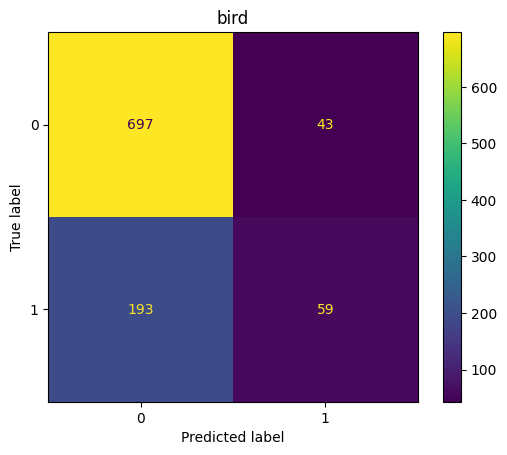

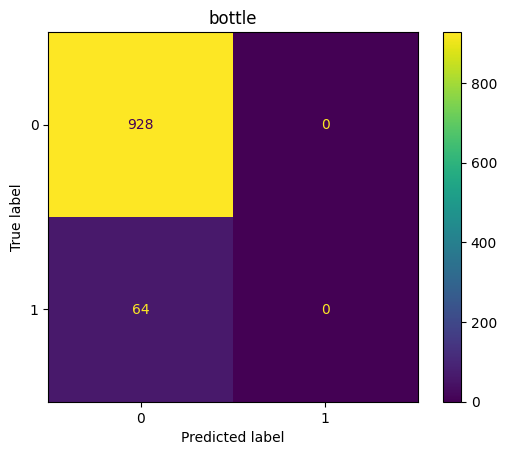

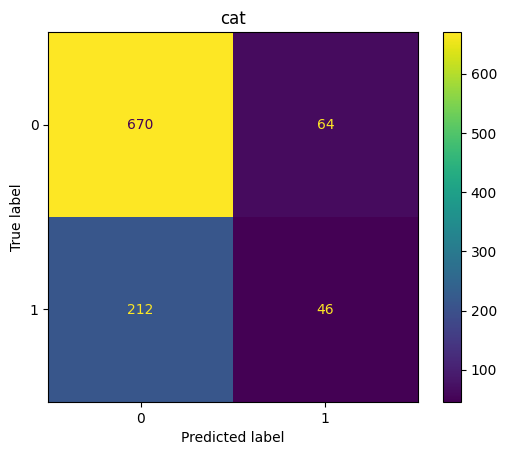

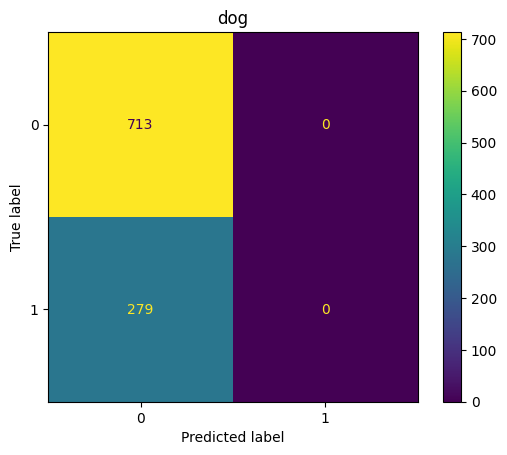

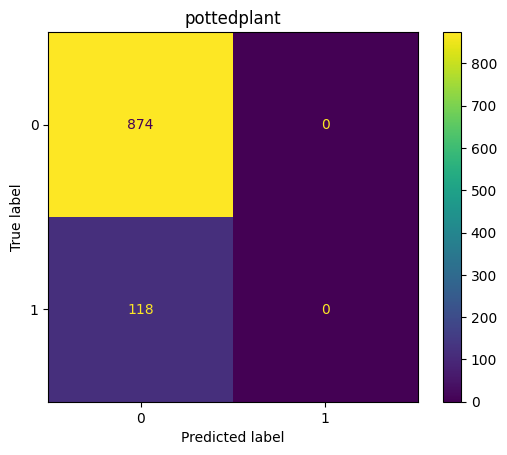

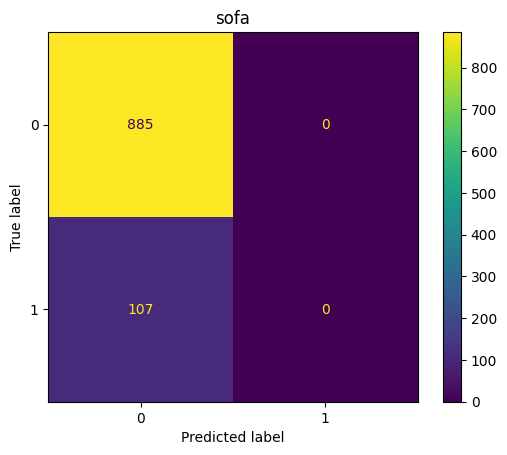

In [68]:
# Move the tensor to CPU memory
pred_cat_cpu = pred_cat.cpu()
true_cat_cpu = true_cat.cpu()

# plot multilabel_confusion_matrix for each class
from sklearn.metrics import multilabel_confusion_matrix, ConfusionMatrixDisplay
confusion = multilabel_confusion_matrix(true_cat_cpu, pred_cat_cpu)

# Display the confusion matrix
for i,item in enumerate(confusion):
    disp = ConfusionMatrixDisplay(item)
    disp.plot(cmap='viridis')
    plt.title(labels_all[i])
    plt.show()

*This model is biased towards predicting 0*

In [69]:
## classification report
from sklearn.metrics import classification_report

label_names = [id_to_label[i] for i in range(len(id_to_label))]

print(classification_report(true_cat_cpu, pred_cat_cpu,target_names=label_names, zero_division=0))

              precision    recall  f1-score   support

        bird       0.58      0.23      0.33       252
      bottle       0.00      0.00      0.00        64
         cat       0.42      0.18      0.25       258
         dog       0.00      0.00      0.00       279
 pottedplant       0.00      0.00      0.00       118
        sofa       0.00      0.00      0.00       107

   micro avg       0.50      0.10      0.16      1078
   macro avg       0.17      0.07      0.10      1078
weighted avg       0.24      0.10      0.14      1078
 samples avg       0.11      0.10      0.10      1078



### Conclusion:

This model demonstrates limited performance with lower precision and recall values. The smaller number of samples for each class could be the main reason for this lower performance.  

#Exercise


1. Try improving the performance of this model
2. Try implementing the Resnet architecture on CIFAR-10 Dataset